<a href="https://colab.research.google.com/github/GFDRR/caribbean-rooftop-classification/blob/add%2Ftutorials/tutorials/02_building_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Rooftop Classification from Drone Imagery (Part II)

# Install Dependencies

In [32]:
%%capture
!git clone https://github.com/GFDRR/caribbean-rooftop-classification.git
!pip -q install leafmap rasterio json_fix leafmap mapclassify

In [33]:
%cd caribbean-rooftop-classification/
!git checkout add/tutorials

/content/caribbean-rooftop-classification/caribbean-rooftop-classification
Branch 'add/tutorials' set up to track remote branch 'add/tutorials' from 'origin'.
Switched to a new branch 'add/tutorials'


## Imports and Setup

In [34]:
import os
import sys
import gdown
import joblib
import subprocess

import rasterio as rio
from rasterio.plot import show
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import geopandas as gpd
from tqdm.notebook import tqdm

from shapely.geometry import box
import leafmap

sys.path.insert(0, "./utils/")
import pred_utils
import config

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## File Locations & Directories

In [35]:
# Data and config directory
data_dir = "./data/"
config_dir = "./configs/cnn/"

# Create model directory
model_dir = './models/'
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

# Create output directory
out_dir = './output/'
if not os.path.exists(out_dir):
    os.makedirs(out_dir)

# Download Data

In [36]:
image_file = os.path.join(data_dir, "drone.tif")
bldgs_file = os.path.join(data_dir, "building_footprints.gpkg")

gid = "1afodaBDzBZbCGMYyTLMcX3oYOjLLpPeI"
url = f"https://drive.google.com/uc?id={gid}"
gdown.download(url, image_file, quiet=False)

gid = "1lGaWwWegUbswdSYhr4rU8a3XWyGUdJz9"
url = f"https://drive.google.com/uc?id={gid}"
gdown.download(url, bldgs_file, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1afodaBDzBZbCGMYyTLMcX3oYOjLLpPeI
To: /content/caribbean-rooftop-classification/caribbean-rooftop-classification/data/drone.tif
100%|██████████| 12.2M/12.2M [00:00<00:00, 91.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1lGaWwWegUbswdSYhr4rU8a3XWyGUdJz9
To: /content/caribbean-rooftop-classification/caribbean-rooftop-classification/data/building_footprints.gpkg
100%|██████████| 131k/131k [00:00<00:00, 30.4MB/s]


'./data/building_footprints.gpkg'

# Load Datasets

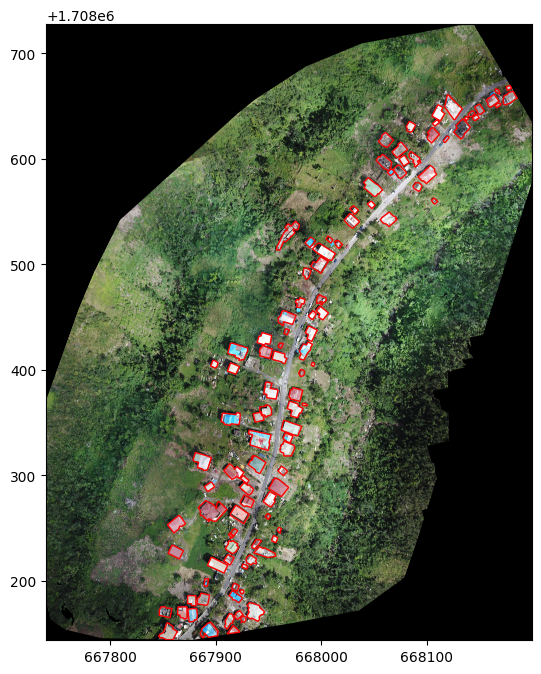

In [37]:
bldgs = gpd.read_file(bldgs_file).reset_index(drop=True)[['geometry']]
bldgs['UID'] = bldgs.index

image = rio.open(image_file)
fig, ax = plt.subplots(figsize=(8,8))
bldgs.plot(facecolor="none", edgecolor='red', ax=ax, aspect=1)
show(image, ax=ax);

# Model Prediction using only RGB Aerial Imagery

In [38]:
filename = "cnn-roof_material-RGB-resnet50.yaml"
cnn_config_file = os.path.join(config_dir, filename)
model_file = os.path.join(model_dir, "rgb_model.pth")

gid = "1QQFQ52vQytq_uM-fhsr3uzfCdM71TY6E"
url = f"https://drive.google.com/uc?id={gid}"
gdown.download(url, model_file, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1QQFQ52vQytq_uM-fhsr3uzfCdM71TY6E
To: /content/caribbean-rooftop-classification/caribbean-rooftop-classification/models/rgb_model.pth
100%|██████████| 94.4M/94.4M [00:00<00:00, 197MB/s]


'./models/rgb_model.pth'

In [39]:
preds = pred_utils.predict(
    bldgs,
    image_file,
    out_dir,
    cnn_config_file,
    model_file
)
preds.head(3)

100%|███████████████| 110/110 [00:27<00:00,  3.94it/s]


,geometry,UID,roof_material,BLUE_TARP_PROB,CONCRETE_CEMENT_PROB,HEALTHY_METAL_PROB,INCOMPLETE_PROB,IRREGULAR_METAL_PROB
0,"POLYGON ((667863.549 1708152.380, 667864.199 1...",0,HEALTHY_METAL,0.015771,0.024646,0.856955,0.056976,0.045651
1,"POLYGON ((667889.104 1708146.579, 667888.054 1...",1,BLUE_TARP,0.942021,0.014442,0.012618,0.023088,0.007831
2,"POLYGON ((667879.502 1708173.985, 667882.203 1...",2,BLUE_TARP,0.921235,0.009561,0.024175,0.013542,0.031486


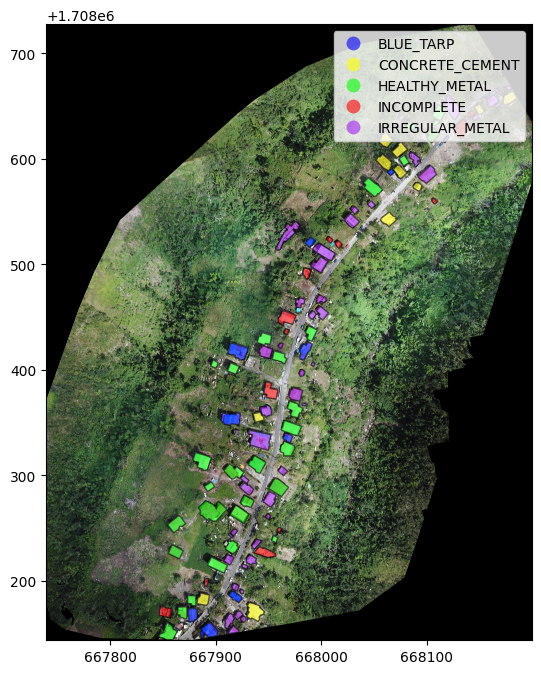

In [44]:
import matplotlib.colors as colors

image = rio.open(image_file)
fig, ax = plt.subplots(figsize=(8,8))
color_dict = {
    "BLUE_TARP": '#0000FF',
    "CONCRETE_CEMENT": '#FFFF00',
    "HEALTHY_METAL": '#00FF00',
    'IRREGULAR_METAL': '#FF0000',
    'INCOMPLETE': '#A020F0'
}
preds['color'] = preds['roof_material'].map(color_dict)
cmap = colors.ListedColormap(list(color_dict.values()))
preds.plot(
    column='roof_material',
    cmap=cmap,
    edgecolor='black',
    alpha=0.6,
    ax=ax,
    aspect=1,
    legend=True,
)
show(image, ax=ax);

# Interactive Plot

In [41]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
!pip install -q localtileserver

In [45]:
data = gpd.GeoDataFrame({"id":1,"geometry":[box(*image.bounds)]}, crs=image.crs).to_crs("EPSG:4326")
centroid = data.geometry.values[0].centroid

map = leafmap.Map(center=[centroid.y, centroid.x], zoom=20)
map.add_raster(image_file, layer_name="Image", zoom=20)

def fill_color(feature):
  return {
    "color": feature['properties']['color'],
    "fillColor": feature['properties']['color'],
  }
style = {'fillOpacity': 0.5}
map.add_legend(
    title='Legend',
    legend_dict=color_dict,
    draggable=True
)
map.add_gdf(
    preds,
    layer_name="roof_material",
    info_mode="on_hover",
    style=style,
    style_callback=fill_color
)
map

Map(center=[15.447516413159208, -61.43446450066211], controls=(ZoomControl(options=['position', 'zoom_in_text'…